# Final Project Artifact

## Glioma Segmentation using SAM 2

#### SID: 2216685

# Importing Libraries & Examining Dataset

In [ ]:
! python --version

Python 3.11.12


In [ ]:
#Cloning Meta's SAM 2 Github repository and downloading it to runtime memory
!git clone https://github.com/facebookresearch/segment-anything-2
%cd /content/segment-anything-2
!pip install -q -e .

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 15.11 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━

In [ ]:
#Install Pywavelets and ensure Hydra is downloaded (used to retrieve SAM 2 model files)
!pip install Pywavelets
!pip install hydra-core --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 114.3 MB/s eta 0:00:00


In [ ]:
#Importing the necessary libraries and mounting Google Drive
import numpy as np
import os
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import nibabel as nib
import pywt
import cv2
from google.colab import drive
drive.mount('/content/drive')
#import nilearn as nl
#import nilearn.plotting as nlplt

Mounted at /content/drive


In [ ]:
# Dataset path to folder in google drive
trainDatasetPath = "/content/drive/My Drive/Final_Project/BraTS2020_TrainingData"
#Checks whether the dataset path exists and then prints the file path
isExist = os.path.exists(trainDatasetPath)
print(isExist)
print(trainDatasetPath)

True
/content/drive/My Drive/Final_Project/BraTS2020_TrainingData


# Example Data

In [ ]:
# Extract the shape and data type of the file
#https://stackoverflow.com/questions/61374801/how-to-read-images-for-nib-load-function-so-they-can-be-resized
#https://stackoverflow.com/questions/54705304/what-is-difference-between-get-data-and-get-fdata-in-nibabel-library
def fileDetails(filePath):
  print(filePath)
  sampleImg = nib.load(filePath).get_fdata()
  print("Shape:", sampleImg.shape)
  print("Data type:", sampleImg.dtype)

In [ ]:
#Absolute paths for the T1 Image and Mask of this
sampleImgPath = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii")
sampleMaskPath = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii")
isExist = os.path.exists(sampleImgPath)
print(isExist)

sImg= fileDetails(sampleImgPath)
sMask= fileDetails(sampleMaskPath)

True
/content/drive/My Drive/Final_Project/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii
Shape: (240, 240, 155)
Data type: float64
/content/drive/My Drive/Final_Project/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii
Shape: (240, 240, 155)
Data type: float64


In [ ]:
#Load the file data for each image modality and return it
##https://stackoverflow.com/questions/61374801/how-to-read-images-for-nib-load-function-so-they-can-be-resized
#https://stackoverflow.com/questions/54705304/what-is-difference-between-get-data-and-get-fdata-in-nibabel-library

def exampleData(filePath):
    file = nib.load(filePath).get_fdata()
    return file

In [ ]:
#Loading each modality into the workspace (for 1 example)

flairPath = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii")
flair= exampleData(flairPath)

maskPath = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii")
mask = exampleData(maskPath)

t1Path = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1.nii")
t1 = exampleData(t1Path)

t1cePath = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1ce.nii")
t1ce = exampleData(t1cePath)

t2Path = os.path.abspath(trainDatasetPath+"/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t2.nii")
t2 = exampleData(t2Path)

Text(0.5, 1.0, 'Mask')

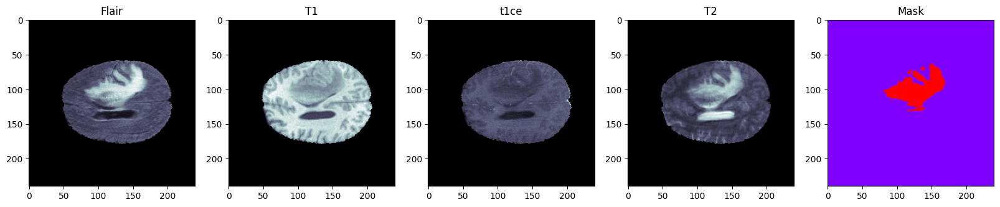

In [ ]:
#Plots each modality in a matplotlib subplot and display example data
fig, ax = plt.subplots(1,5, figsize=(20,20))
ax[0].imshow(flair[:,:,95], cmap='bone')
ax[0].set_title("Flair")

ax[1].imshow(t1[:,:,95], cmap="bone")
ax[1].set_title("T1")

ax[2].imshow(t1ce[:,:,95], cmap="bone")
ax[2].set_title("t1ce")

ax[3].imshow(t2[:,:,95], cmap="bone")
ax[3].set_title("T2")

ax[4].imshow(mask[:,:,95], cmap='rainbow')
ax[4].set_title("Mask")

In [ ]:
training_OD = "/content/drive/My Drive/Final_Project/sliced_TrainingDataset_T"


/content/sliced_TrainingDataset_T


# Importing Dataset & Preprocessing

## Slicing the 3D Fused Volumetric Data

In [ ]:
# Slicing fused Images & Saving these
# The modalities slcied will be: Flair, T1ce, T2 and the segmentation
import sklearn.preprocessing as preproc
#Must adjust the thresholds for this data
robust_scaler = preproc.RobustScaler()
def slice_Data(fused_File,mask, patient):
    training_OD = "/content/drive/My Drive/Final_Project/sliced_TrainingDataset_T"
    mask_OD = "/content/drive/My Drive/Final_Project/sliced_GroundTruths_T"

    #https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html
    #Applies robust scaler, removing the median pixel intensities and moving the rest across IQR
    fused_File = robust_scaler.fit_transform(fused_File.reshape(-1,1)).reshape(fused_File.shape)
    for frame in range(0,fused_File.shape[2]):
        #https://www.geeksforgeeks.org/formatted-string-literals-f-strings-python/
        #Set the file and mask names according to the BraTS2020 dataset
        filePath=f'{training_OD}/{patient}_{frame}.png'
        maskPath=f'{mask_OD}/{patient}_{frame}.png'
        file_Frame = fused_File[:,:,frame]
        #https://www.geeksforgeeks.org/normalize-an-image-in-opencv-python/
        #https://www.tutorialspoint.com/how-to-normalize-an-image-in-opencv-python
        #Min-max normalises the fused mri frame
        file_Frame = cv2.normalize(file_Frame, None, 0,255, cv2.NORM_MINMAX)
        mask_Frame = mask[:,:,frame]
        mask_Frame=np.float32(mask_Frame)
        #https://stackoverflow.com/questions/46689428/convert-np-array-of-type-float64-to-type-uint8-scaling-values
        #Converts the mask to a uint8 and then converts it to binary.
        mask_Frame = (mask_Frame * 255).astype(np.uint8)
        #https://stackoverflow.com/questions/7624765/converting-an-opencv-image-to-black-and-white
        binary_Mask  = cv2.threshold(mask_Frame, 127,255,cv2.THRESH_BINARY)[1]
        #Ensures only files with the brain tumour present, are written and presented to the model
        #https://numpy.org/doc/stable/reference/generated/numpy.any.html
        if np.any(binary_Mask):
            cv2.imwrite(filePath,file_Frame)
            cv2.imwrite(maskPath,binary_Mask)
        else:
            continue

## Discrete Wavelet Transformation and Mean Image Fusion

In [ ]:
#https://stackoverflow.com/questions/42608721/image-fusion-using-wavelet-transform-in-python
##https://pywavelets.readthedocs.io/en/latest/ref/dwt-discrete-wavelet-transform.html
#Wavelet Transformation/ Image Fusion
# Modalities fused: Flair, T1ce and T2 & Stored in a PNG

def fuse_Coefficients(cFlair, cT1, cT1ce, cT2):
    # Combining the coefficients together and dividing by four
    # Fusion method = mean
    fused_Coeff = (cFlair+cT1+cT1ce+cT2) / 4.0
    return fused_Coeff

def wavelet_Transformation(Flair,T1,T1ce,T2,max_Frames):
    #Each modality is decomposed to wavelet coefficients
    flair_Coeff = pywt.wavedecn(Flair, "db4", level=4)
    t1_Coeff = pywt.wavedecn(T1, "db4", level=4)
    t1ce_Coeff = pywt.wavedecn(T1ce, "db4", level=4)
    t2_Coeff = pywt.wavedecn(T2, "db4", level=4)
    #https://stackoverflow.com/questions/6142689/initialising-an-array-of-fixed-size-in-python
    #Used to store the approximations and fused coefficients
    fused_Coef =  [None] * len(flair_Coeff)
    #Stores the approximation coefficients
    fused_Coef[0]=fuse_Coefficients(flair_Coeff[0],t1_Coeff[0],t1ce_Coeff[0],t2_Coeff[0])
    # Iterates over the levels in each files coefficients based on the length of the flair
    for i in range(1, len(flair_Coeff)):
        fused_Coef[i]={}
        # Iterates over the keys of the dictionary storing the positional details
        for axis in flair_Coeff[i]:
            flair = flair_Coeff[i][axis]
            t1 = t1_Coeff[i][axis]
            t1ce = t1ce_Coeff[i][axis]
            t2 = t2_Coeff[i][axis]
            # Fuses the 4 inputs together and stores it in the retrospective level and key value
            fused_Coef[i][axis]=fuse_Coefficients(flair,t1,t1ce,t2)
    #Reconstructs the fused coefficients producing the fused MRI volume
    fused_MRI = pywt.waverecn(fused_Coef, "db4")
    #Ensures the fused file does not exceed the maximum number of frames in the flair file
    fused_MRI=fused_MRI[:,:,0:max_Frames]
    return fused_MRI

## Loading the BraTS2020 Dataset to the workspace

In [ ]:
#https://www.geeksforgeeks.org/z-score-normalization-definition-and-examples/
#Performing Z-Score normalisation
def zScoreNormal(file):
    mean = np.mean(file)
    std_Dev = np.std(file)
    zFile = (file-mean)/std_Dev
    return zFile

#Importing the dataset and storing the slices in iterations#
def import_Store_Files(patient_Data,fileName):
    #Import the four modalities: Flair, T1ce, T2, Segmentation
    #Append the patient folder name to the file path for each file to extract the data
    path=patient_Data+"/"+fileName
    Flair = nib.load(path+"_flair.nii").get_fdata()
    #Clips the first and last five frames from the file
    Flair=Flair[:,:,5:-5]
    Flair = zScoreNormal(Flair)
    T1 = nib.load(path+"_t1.nii").get_fdata()
    T1 = T1[:,:,5:-5]
    T1 = zScoreNormal(T1)
    T1ce = nib.load(path+"_t1ce.nii").get_fdata()
    T1ce = T1ce[:,:,5:-5]
    T1ce = zScoreNormal(T1ce)
    T2 = nib.load(path+"_t2.nii").get_fdata()
    T2=T2[:,:,5:-5]
    T2 = zScoreNormal(T2)
    mask = nib.load(path+"_seg.nii").get_fdata()
    mask=mask[:,:,5:-5]
    #Sets the maximum number of frames in the fused file, according to the shape of the flair
    max_Frames = Flair.shape[2]
    #Applies Discrete Wavelet Transform on the four modalities
    fused_File = wavelet_Transformation(Flair,T1,T1ce,T2,max_Frames)
    return fused_File, mask

In [ ]:
# Apply data preprocessing
# Using a loop to iterate through each folder of the specified datset to apply the methods above
# This is then stored in a seperate folder from the dataset
trainDatasetPath = "/content/drive/My Drive/Final_Project/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData"
dir_List = os.listdir("/content/drive/My Drive/Final_Project/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData")

for patient in dir_List:
    folderPath = trainDatasetPath+"/"+patient
    fused_File, mask = import_Store_Files(folderPath,patient)
    slice_Data(fused_File,mask, patient)

# Fused Slice with Mask Example

(240, 240)
(240, 240)


Text(0.5, 1.0, 'Mask')

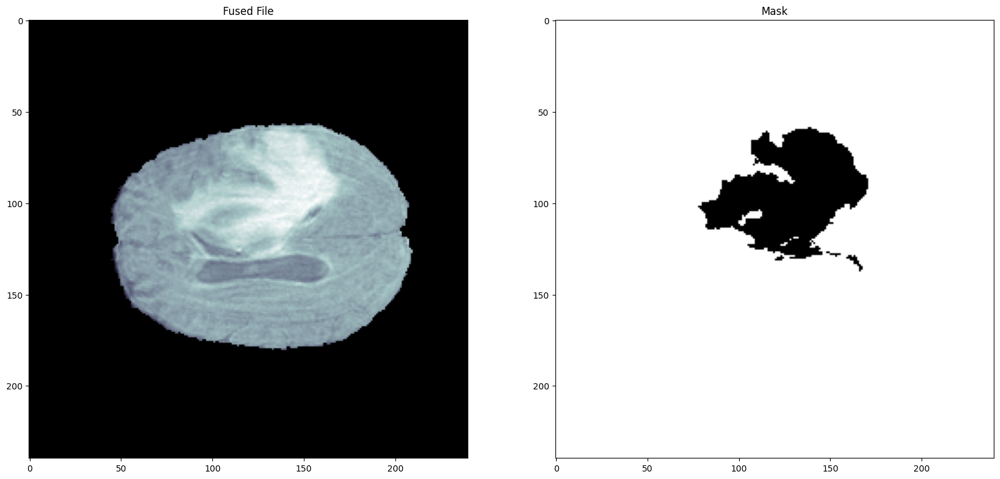

In [ ]:
#Displaying a Fused file slice example using matplotlib's subplots
fusedFile = "/content/drive/My Drive/Final_Project/sliced_TrainingDataset_T/BraTS20_Training_001_85.png"
mask = "/content/drive/My Drive/Final_Project/sliced_GroundTruths_T/BraTS20_Training_001_85.png"
img = cv2.imread(fusedFile,cv2.IMREAD_GRAYSCALE)
print(img.shape)
mask = cv2.imread(mask, cv2.IMREAD_GRAYSCALE)
print(mask.shape)
fig, ax = plt.subplots(1,2, figsize=(20,20))

ax[0].imshow(img, cmap="bone")
ax[0].set_title("Fused File")
ax[1].imshow(mask, cmap="binary")
ax[1].set_title("Mask")

# Example Prompt Generation

In [ ]:
#Generating prompts (points) from the segmentation mask
#Code is from here:
#https://medium.com/data-science/train-fine-tune-segment-anything-2-sam-2-in-60-lines-of-code-928dd29a63b3
#https://www.datacamp.com/tutorial/sam2-fine-tuning
def generate_Prompts(seg_Mask):
    points=[]
    bbPoints=[]
    bbBox_Areas=[]
    #https://stackoverflow.com/questions/41542861/unable-to-display-bounding-rectangles-around-contours-in-opencv-python
    #Finds the contours/ points used for the bounding boxes
    contours, _ = cv2.findContours(seg_Mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #Creates the bounding boxes and appends the points to a list
    if len(contours)!=0:
        for contour in contours:
            bbPoint = cv2.boundingRect(contour)
            bbPoints.append([bbPoint[0],bbPoint[1],bbPoint[2],bbPoint[3]])
            #https://stackoverflow.com/questions/75907125/compute-an-area-with-cv2-contourarea
            #Calculates the areas of the bounding box
            area = cv2.contourArea(contour)
            bbBox_Areas.append(area)
        if len(bbBox_Areas)>1:
            #Selects the bounding box with the largest area
            # SAM can only accept one bounding box per image for the batch
            max_Area = bbBox_Areas.index(max(bbBox_Areas))
            bbBox = bbPoints[max_Area]
            bbPoints.clear()
            bbPoints.append(bbBox)
    #Erodes the segmentation mask to prevent the points being at the boundary
    seg_Mask = cv2.erode(seg_Mask, np.ones((5,5), np.uint8),iterations=1)
    #Grabs the co-ordinates of any points within the segmentation mask
    coOrdinates = np.argwhere(seg_Mask>0)
    if len(coOrdinates>0):
        #Will randomly generate five co-ordinates in the segmentation mask
        for _ in range(5):
            yx=np.array(coOrdinates[np.random.randint(len(coOrdinates))])
            points.append([yx[0],yx[1]])
    #Converts all the prompts to NumPy arrays
    points = np.array(points)
    bbPoints = np.array(bbPoints)
    labels = np.ones(points.shape[0])
    return points, bbPoints, labels

## Example Fused Slice with prompts

In [ ]:
examplePrompt, bbBoxPrompt, label = generate_Prompts(mask)

In [ ]:
print(bbBoxPrompt)

[[78 59 93 72]]


Text(0.5, 1.0, 'Mask with Prompts')

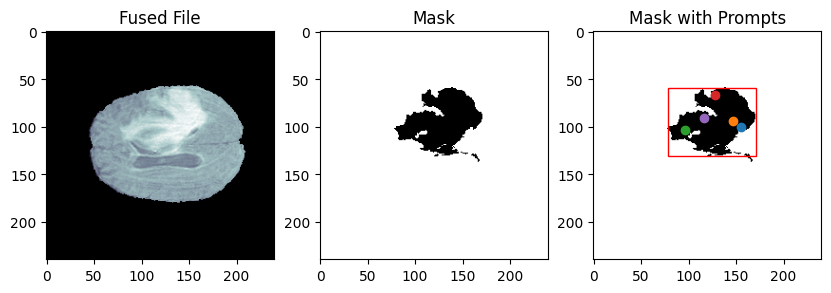

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(10,10))
ax[0].imshow(img, cmap="bone")
ax[0].set_title("Fused File")
ax[1].imshow(mask, cmap="binary")
ax[1].set_title("Mask")
ax[2].imshow(mask, cmap="binary")
for i, point in enumerate(examplePrompt):
    ax[2].scatter(point[1],point[0])
#https://stackoverflow.com/questions/37435369/how-to-draw-a-rectangle-on-image
#Plotting the bounding boxes from the segmentation
for bBox in bbBoxPrompt:
    x,y,width,height = bBox
    bRectangle = patches.Rectangle((x,y),width,height, linewidth=1,edgecolor='red',facecolor="none")
    ax[2].add_patch(bRectangle)
ax[2].set_title("Mask with Prompts")

# PyTorch Dataset and DataLoaders

In [ ]:
#https://stackoverflow.com/questions/59710439/google-colab-and-google-drive-copy-file-from-colab-to-google-drive
#https://stackoverflow.com/questions/49685924/extract-google-drive-zip-from-google-colab-notebook
#https://medium.com/@amitregmi11/bash-command-for-google-colab-9897bf8f205c
#Copy the zipped dataset to Colab's runtime memory
!cp -r "/content/drive/My Drive/Final_Project/sliced_TrainingDataset_T.zip" "/content/"
!cp -r "/content/drive/My Drive/Final_Project/sliced_GroundTruths_T.zip" "/content/"
#Unzip the folders and store them in runtime memory
!unzip -q "/content/sliced_TrainingDataset_T.zip" -d "/content/sliced_TrainingDataset_T"
!unzip -q "/content/sliced_GroundTruths_T.zip" -d "/content/sliced_GroundTruths_T"
#Checks whether the directories are there and lists them
!ls "/content/sliced_TrainingDataset_T"
!ls "/content/sliced_GroundTruths_T"

sliced_TrainingDataset_T
sliced_GroundTruths_T


In [ ]:
#Create a PyTorch dataset and dataloader for batch processing
from torch.utils.data import Dataset

#(Redundant function) Retrieves the images from the batch of image names.
def readFilesv2(images,GTs,data_Dir,gt_Dir):
    batch=[]
    gtBatch=[]
    for image, GT in zip(images,GTs):
        #Reads each MRI scan based off the file paths in batch
        image = cv2.imread(image)
        #Reads the ground truth in, in grayscale and converts it to binary
        GT = cv2.imread(GT,cv2.IMREAD_GRAYSCALE)
        _, GT = cv2.threshold(GT,127,255,cv2.THRESH_BINARY)
        batch.append(image)
        gtBatch.append(GT)
    return batch,gtBatch

#https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
#Used to retrieve a batch of file names in the dataset
class bratsDataset(Dataset):
    def __init__(self, data_dir,gt_dir, transform=None, intensity_transform=None):
        self.data_dir = data_dir
        self.gt_dir = gt_dir
        #Sorts the directories to ensure when retrieving a MRI scan, the correlating ground truth is retrieved also
        self.mriPaths = sorted([os.path.join(data_dir, file) for file in os.listdir(data_dir)])
        self.gtPaths = sorted([os.path.join(gt_dir, file) for file in os.listdir(gt_dir)])
        #Determines whether spatial or intensity transforms are applied to the training dataset
        self.transform = transform
        self.intensity_transform= intensity_transform
    def __len__(self):
        return len(self.mriPaths)
    def __getitem__(self,idx):
        batch = self.mriPaths[idx]
        gt_batch = self.gtPaths[idx]
        img,gt= self.readFiles(batch,gt_batch)
        if self.transform:
            #Applies the same spatial augmentations to the MRI scan and correlating ground truth
            augmentations = self.transform(image=img,mask=gt)
            img=augmentations['image']
            gt=augmentations['mask']
        if self.intensity_transform:
            #Applies intensity augmentations only to the MRI scan
            intense_Img = self.intensity_transform(image=img)
            img = intense_Img['image']
        #Generate the prompts for SAM 2
        rPoints, bPoints, label = self.generate_Promptsv2(gt)
        #Ensures that if nothing is returned from the prompt generation the batch is padded.
        if rPoints.size == 0:
            rPoints = np.zeros([5,2], dtype=int)
        if bPoints.size==0:
            bPoints = np.zeros([1,4],dtype=int)
        if label.size==0:
            label = np.zeros(5)
        return img,gt,rPoints,bPoints,label

    #Retrieves the images with the filepath passed to it
    def readFiles(self,image,GT):
        image = cv2.imread(image)
        GT = cv2.imread(GT,cv2.IMREAD_GRAYSCALE)
        _, GT = cv2.threshold(GT,127,255,cv2.THRESH_BINARY)
        return image,GT
    #Generate the prompts from the segmentation mask
    def generate_Promptsv2(self,seg_Mask):
        points=[]
        bbPoints=[]
        sam_BBox=[]
        bbBox_Areas=[]
        #https://stackoverflow.com/questions/41542861/unable-to-display-bounding-rectangles-around-contours-in-opencv-python
        #Finds the contours/ points used for the bounding boxes
        contours, _ = cv2.findContours(seg_Mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #Creates the bounding boxes and appends the points to a list
        if len(contours)!=0:
            for contour in contours:
                bbPoint = cv2.boundingRect(contour)
                x_max = bbPoint[0]+bbPoint[2]
                y_max = bbPoint[1]+bbPoint[3]
                bbPoints.append([bbPoint[0],bbPoint[1],bbPoint[2],bbPoint[3]])
                sam_BBox.append([bbPoint[0],bbPoint[1],x_max,y_max])
            #https://stackoverflow.com/questions/75907125/compute-an-area-with-cv2-contourarea
            #Calculates the areas of the bounding box
                area = cv2.contourArea(contour)
                bbBox_Areas.append(area)
            if len(bbBox_Areas)>1:
            #Selects the bounding box with the largest area
            # SAM can only accept one bounding box per image for the batch
                max_Area = bbBox_Areas.index(max(bbBox_Areas))
                bbBox = bbPoints[max_Area]
                bbPoints.clear()
                bbPoints.append(bbBox)
                sam_BBox.clear()
                x_max = bbPoint[0]+bbPoint[2]
                y_max = bbPoint[1]+bbPoint[3]
                sam_BBox.append([bbPoint[0],bbPoint[1],x_max,y_max])
        #Erodes the segmentation mask to prevent the points being at the boundary
        seg_Mask = cv2.erode(seg_Mask, np.ones((5,5), np.uint8),iterations=1)
        #Grabs the co-ordinates of any points within the segmentation mask
        coOrdinates = np.argwhere(seg_Mask>0)
        if len(coOrdinates>0):
        #Will randomly select five co-ordinates in the segmentation mask
            for _ in range(5):
                yx=np.array(coOrdinates[np.random.randint(len(coOrdinates))])
                points.append([yx[0],yx[1]])
        #Converts all the prompts back to NumPy Arrays
        points = np.array(points)
        bbPoints = np.array(bbPoints)
        sam_BBox = np.array(sam_BBox)
        labels = np.ones(points.shape[0])
        return points, sam_BBox, labels

In [ ]:
#https://vfdev-5-albumentations.readthedocs.io/en/docs_pytorch_fix/api/augmentations.html
#https://albumentations.ai/docs/3-basic-usage/semantic-segmentation/
# Applying Augmentations to the dataset to prevent the model overfitting
import albumentations as A
train_Data_Transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15,p=0.5),
],p=1.0)
# Adjust the pixel intensities: Increase brightness and contrast
intense_TD_Transform = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2,p=0.5),
    A.RandomGamma(gamma_limit=(80,120),p=0.3),
],p=1.0)

In [ ]:
from torch.utils.data import DataLoader
from torch.utils.data import random_split

data_Dir = "/content/sliced_TrainingDataset_T/sliced_TrainingDataset_T"
gt_Dir = "/content/sliced_GroundTruths_T/sliced_GroundTruths_T"

dataset = bratsDataset(data_Dir, gt_Dir)
print(int(len(dataset)))
#https://discuss.pytorch.org/t/torch-utils-data-dataset-random-split/32209/4
#Splits the dataset into training and testing
print(int(len(dataset)*0.7))
print(int(len(dataset)*0.15))
print(int(len(dataset)*0.15))
train_Data_Length = [int(len(dataset)*0.70+1), int(len(dataset)*0.15), int(len(dataset)*0.15)]

train_Data, val_Data, test_Data = random_split(dataset, train_Data_Length)

#https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
#Retrieves the training and testing datasets (file names) in batches of four
train_DataLoader = DataLoader(train_Data, batch_size=4, pin_memory=True, shuffle=True)
val_DataLoader = DataLoader(val_Data, batch_size=4, pin_memory=True, shuffle=False)
#Ensures the augmentations are not applied to the validation dataset
val_Data.dataset.transform = None
val_Data.dataset.intensity_transform = None

test_DataLoader = DataLoader(test_Data, batch_size=4, pin_memory=True, shuffle=False)
#Ensures the augmentations are not applied to the test dataset
test_Data.dataset.transform = None
test_Data.dataset.intensity_transform = None

24422
17095
3663
3663


## Batch Test

In [ ]:
#Randomly grabs a batch from the training dataloader
img_Batch, gt_Batch,points,bBox,labels = next(iter(train_DataLoader))

Text(0.5, 1.0, 'Mask')

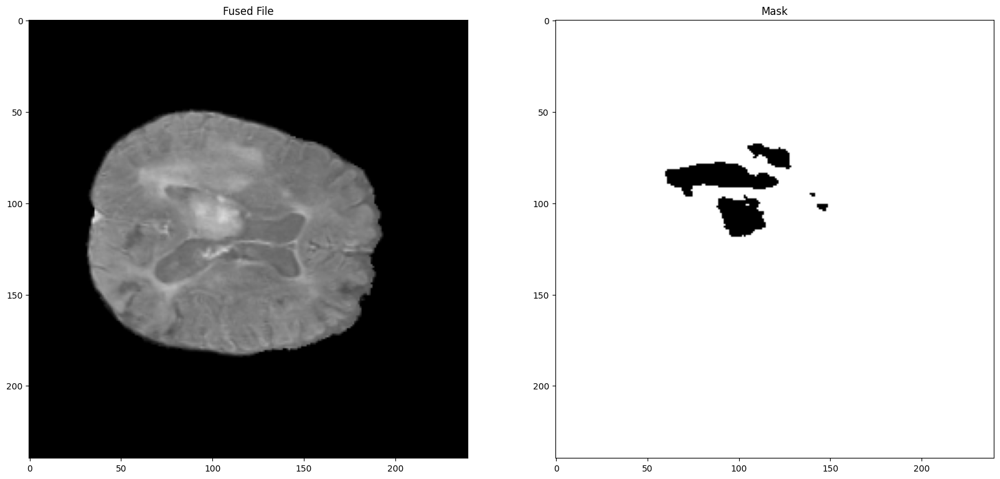

In [ ]:
#Displays example MRI scan and correlating mask
fig, ax = plt.subplots(1,2, figsize=(20,20))
ax[0].imshow(img_Batch[1], cmap="bone")
ax[0].set_title("Fused File")
ax[1].imshow(gt_Batch[1],cmap="binary")
ax[1].set_title("Mask")

# SAM 2 Finetuning Pipeline

## Importing SAM 2 Hiera Small and setting Hyperparameters

In [ ]:
#Used to get the SAM 2.1 Hiera Base Small model checkpoint
#!wget -O sam2_hiera_small.pt "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt"
!wget -O sam2.1_hiera_small.pt "https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt"

--2025-05-05 16:18:56--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.202.124, 13.35.202.30, 13.35.202.17, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.202.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184416285 (176M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_small.pt’

sam2.1_hiera_small. 100%[===================>] 175.87M   271MB/s    in 0.6s    

2025-05-05 16:18:57 (271 MB/s) - ‘sam2.1_hiera_small.pt’ saved [184416285/184416285]



In [ ]:
#https://github.com/facebookresearch/sam2?tab=readme-ov-file
#Imports the necessary libraries for training SAM 2
import torch
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter

#Sets the model config and checkpoint filepaths
checkpoint = "sam2.1_hiera_small.pt"
model_config = "/configs/sam2.1/sam2.1_hiera_s.yaml"
model=build_sam2(model_config, checkpoint, device="cuda")

#Ensures the model is built on the GPU if not its moved there if available
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
print(device)
model = model.to(device)
#Sets up the Image Predictor
sam2_model = SAM2ImagePredictor(model)
#Used to write the dice loss and dice scores throughout finetuning
writer=SummaryWriter()

cuda


# Dice Score and Loss calculation

In [ ]:
#The dice loss calculation is a slight adaption of the dice loss code from here:
#https://medium.com/data-scientists-diary/implementation-of-dice-loss-vision-pytorch-7eef1e438f68
def dice_Calculation(prd_Masks, gt_Masks):
    #Applies sigmoid function again to ensure that is been applied
    prd_Masks = torch.sigmoid(prd_Masks[:,0])
    #Applies thresholding to create a binary mask
    prd_Masks = (prd_Masks>0.5).float()
    gt_Masks = gt_Masks.bool().float()
    Inter = (prd_Masks*gt_Masks).sum(dim=(1,2))
    union = prd_Masks.sum(dim=(1,2))+gt_Masks.sum(dim=(1,2))
    dice=(2.0*Inter+1e-6)/(union+1e-6)
    dice_Mean=dice.mean()
    #https://pytorch.org/docs/stable/generated/torch.clamp.html
    #Stops the dice mean exceeding 1 (some margin of error)
    dice_Mean = torch.clamp(dice_Mean,0.0,1.0)
    return 1 - dice_Mean, dice

# Segmentation Example, with Box Prompt, before training

Dice Loss: tensor(0.9360, device='cuda:0')
Dice Score: tensor([0.1107, 0.0083, 0.0038, 0.1333], device='cuda:0')
Mean Dice Score:tensor(0.0640, device='cuda:0')


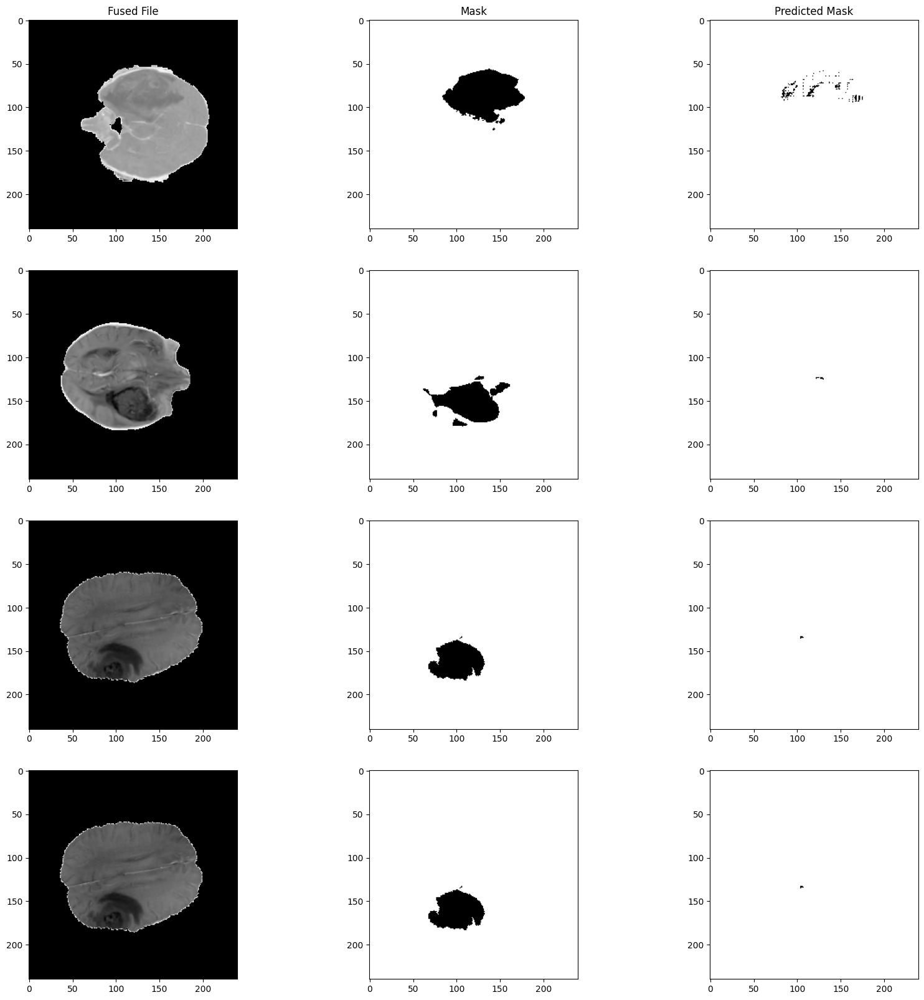

In [ ]:
#Visualise Segmentations
img_Batch, gt_Batch,_,batched_bbPoints,_ = next(iter(test_DataLoader))
img_Batch = img_Batch.to(device)
gt_Batch = gt_Batch.to(device)
#Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
mri_List=[]
gt_List=[]
sam_Predict=[]
#https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
for i in range(4):
    image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
    gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
    image_Numpy = (image_Tensor * 255).astype(np.uint8)
    gt_Numpy = (gt_Tensor*255).astype(np.uint8)
    gt_List.append(gt_Numpy)
    mri_List.append(image_Numpy)
with torch.no_grad():
    #Calculates the Image Embeddings
    sam2_model.set_image_batch(mri_List)
    #Model predicts the segmentation masks and is prompted with bounding box
    prd_masks, scores, logits = sam2_model.predict_batch(None,None,box_batch=batched_bbPoints,multimask_output=True)
    #Ensures the masks are in the correct shape for the dice loss calculation
    prd_masks = torch.from_numpy(np.stack(prd_masks))
    prd_masks=prd_masks.to(device)
    #Dice loss is calculated
    dice_Loss, dice_Score = dice_Calculation(prd_masks,gt_Batch)
    print("Dice Loss: " + str(dice_Loss))
    print("Dice Score: " + str(dice_Score))
    print("Mean Dice Score:" + str(dice_Score.mean()))
    prd_masks = torch.sigmoid(prd_masks[:,0])
    #Converts the predicted mask back to a NumPy array
    for i in range(4):
        pm_Tensor = prd_masks[i].cpu().permute(0,1).numpy()
        sam_Predict.append(pm_Tensor)
#Displays the batch, predicted mask and the actual ground truth in a subplot
fig, ax = plt.subplots(4,3, figsize=(20,20))
ax[0][0].imshow(mri_List[0], cmap="bone")
ax[0][0].set_title("Fused File")
ax[0][1].imshow(gt_List[0], cmap="binary")
ax[0][1].set_title("Mask")
ax[0][2].imshow(sam_Predict[0], cmap="binary")
ax[0][2].set_title("Predicted Mask")
ax[1][0].imshow(mri_List[1], cmap="bone")
ax[1][1].imshow(gt_List[1], cmap="binary")
ax[1][2].imshow(sam_Predict[1], cmap="binary")
ax[2][0].imshow(mri_List[2], cmap="bone")
ax[2][1].imshow(gt_List[2], cmap="binary")
ax[2][2].imshow(sam_Predict[2], cmap="binary")
ax[3][0].imshow(mri_List[2], cmap="bone")
ax[3][1].imshow(gt_List[2], cmap="binary")
ax[3][2].imshow(sam_Predict[2], cmap="binary")

# SAM 2 Training

In [ ]:
#Enables the modules that are being trained/ finetuned
sam2_model.model.image_encoder.train(True)
sam2_model.model.sam_mask_decoder.train(True)
sam2_model.model.sam_prompt_encoder.train(True)

PromptEncoder(
  (pe_layer): PositionEmbeddingRandom()
  (point_embeddings): ModuleList(
    (0-3): 4 x Embedding(1, 256)
  )
  (not_a_point_embed): Embedding(1, 256)
  (mask_downscaling): Sequential(
    (0): Conv2d(1, 4, kernel_size=(2, 2), stride=(2, 2))
    (1): LayerNorm2d()
    (2): GELU(approximate='none')
    (3): Conv2d(4, 16, kernel_size=(2, 2), stride=(2, 2))
    (4): LayerNorm2d()
    (5): GELU(approximate='none')
    (6): Conv2d(16, 256, kernel_size=(1, 1), stride=(1, 1))
  )
  (no_mask_embed): Embedding(1, 256)
)

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
#Adam W optimiser used to apply weight updates and weight decay
adamOpt = torch.optim.AdamW(params=sam2_model.model.parameters(), lr=2e-5, weight_decay=4e-5)
#Used to apply the gradient updates/ back propagate them through the network
gradScaler = torch.amp.GradScaler()
epochs = 100
#Name of outputted finetuned model
ftModel = "brats_FT_Sam2_S_V2_t"
#Gradient accumulation so the batch size is 16
gradient_Steps = 4
#Decreases the models learning rate when the validation accuracy stagnates or worsens
scheduler = ReduceLROnPlateau(adamOpt, mode='max',factor=0.95,patience=3,verbose=True)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
next(sam2_model.model.parameters()).is_cuda

True

# Early Stopping

In [ ]:
#Code from:
#https://medium.com/biased-algorithms/a-practical-guide-to-implementing-early-stopping-in-pytorch-for-model-training-99a7cbd46e9d
#Implements Early Stopping to stop model training if there is no improvement on the validation dataset
class EarlyStopping:
  def __init__(self, patience=10, delta=0,verbose=False):
    self.patience=patience
    self.delta = delta
    self.verbose=verbose
    self.best_loss=None
    self.no_improvement_count=0
    self.stop_training=False
  def check_early_stop(self,val_loss):
    if self.best_loss is None or val_loss<self.best_loss - self.delta:
      self.best_loss = val_loss
      self.no_improvement_count = 0
    else:
      self.no_improvement_count+=1
      if self.no_improvement_count>=self.patience:
        self.stop_training=True
        if self.verbose:
          print("Stopping Training Early. No improvements made")

early_stop = EarlyStopping(patience=10, delta=0, verbose=True)

# Model Training

In [ ]:
#These tutorials were used and adapted to implement this finetuning method:
#https://medium.com/data-science/train-fine-tune-segment-anything-2-sam-2-in-60-lines-of-code-928dd29a63b3
#https://www.datacamp.com/tutorial/sam2-fine-tuning
for epoch in range(1,epochs+1):
    epoch_seg_Loss =[]
    epoch_Dice=[]
    #Loads the training data loader, shuffles it and enable the different augmentations
    train_DataLoader = DataLoader(train_Data, batch_size=4, pin_memory=True, shuffle=True)
    train_Data.dataset.transform = train_Data_Transform
    train_Data.dataset.intensity_transform = intense_TD_Transform
    #Iterates through the batch
    for batch_Index, (img_Batch,gt_Batch,batched_Points,batched_bbPoints,batched_labels) in enumerate(train_DataLoader):
        #If the batch size is less than four its skipped
        if img_Batch.size(0) < 4:
            continue
        #Ensures each variable is currently on the GPU
        img_Batch = img_Batch.to(device).float()
        gt_Batch = gt_Batch.to(device).float()
        batched_Points=batched_Points.to(device)
        batched_bbPoints = batched_bbPoints.to(device)
        batched_labels = batched_labels.to(device)
        #Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
        mri_List=[]
        gt_List=[]
        try:
        #https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
        #Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
        #The shapes of the tensors are adjusted and sent to the CPU for conversion
            for i in range(4):
                image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
                gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
                image_Numpy = (image_Tensor * 255).astype(np.uint8)
                gt_Numpy = (gt_Tensor*255).astype(np.uint8)
                gt_List.append(gt_Numpy)
                mri_List.append(image_Numpy)
        except IndexError as e:
                #Skips the batch if an error with converting the tensors to NumPy arrays occur
            continue
        with torch.amp.autocast("cuda"):
            # Generates the Image Embeddings
            sam2_model.set_image_batch(mri_List)

            #Generates the normalised prompts that are passed to the promp encoder
            mask_input, unnorm_coords, labels, unnorm_box = sam2_model._prep_prompts(batched_Points,batched_labels,box=batched_bbPoints,
                                                                                     mask_logits=None,normalize_coords=True)
            #Generates the sparse and dense embeddings which are used to generate the predicted masks
            sparse_embeddings, dense_embeddings = sam2_model.model.sam_prompt_encoder(points=(unnorm_coords,labels),boxes=unnorm_box,masks=None)
            batchMode = unnorm_coords.shape[0]>1


            #Mask Decoder: produces the low resolution masks alongside the prediction scores
            high_res_features = [feat_level[-1].unsqueeze(0) for feat_level in sam2_model._features["high_res_feats"]]
            low_res_masks, prd_scores,_,_ = sam2_model.model.sam_mask_decoder(image_embeddings=sam2_model._features["image_embed"],
                                                                              image_pe=sam2_model.model.sam_prompt_encoder.get_dense_pe(),
                                                                              sparse_prompt_embeddings=sparse_embeddings,
                                                                              dense_prompt_embeddings=dense_embeddings,
                                                                              multimask_output=False,repeat_image=False,
                                                                              high_res_features=high_res_features)
            prd_masks = sam2_model._transforms.postprocess_masks(low_res_masks, sam2_model._orig_hw[-1])
            #Segmentation Loss/ Dice Loss calculation
            gt_masks = gt_Batch.float()
        #Calculate the Dice Loss and factor in the prediction scores to the loss
        dice_Loss, dice_Score = dice_Calculation(prd_masks,gt_masks)
        dice_SL = torch.abs(prd_scores-dice_Score).mean()
        loss=dice_Loss+dice_SL*0.05
        loss=loss/gradient_Steps

        #Applies Back Propagation
        gradScaler.scale(loss).backward()
        #Clips the gradients to prevent the exploding gradient problem
        torch.nn.utils.clip_grad_norm_(sam2_model.model.parameters(), max_norm=1.0)
        # The AdamW optimser applies weight updates after every four batches
        if batch_Index % gradient_Steps==0:
            gradScaler.step(adamOpt)
            gradScaler.update()
            sam2_model.model.zero_grad()
        #https://saturncloud.io/blog/how-to-get-the-value-of-a-tensor-in-pytorch/#:~:text=done%20using%20the%20.-,item()%20method.,to%20get%20the%20value%20of.
        #Retrieve the dice loss and score values
        epoch_seg_Loss.append(dice_Loss)
        epoch_Dice.append(dice_Score.mean())
    #Calculates the mean dice loss and score
    epoch_Acc = sum(epoch_Dice)/len(epoch_Dice)
    eDice_Loss = sum(epoch_seg_Loss)/len(epoch_seg_Loss)
    #Records the training dice loss and score for each epoch. This is displayed in tensorboard
    writer.add_scalar("Dice Loss/Train",eDice_Loss,epoch)
    writer.add_scalar("Dice Score/ Train", epoch_Acc,epoch)
    print("Current Epoch: " +str(epoch)+ " Accuracy:" + str(epoch_Acc.item()) + " Loss: "+str(eDice_Loss.item()))
    #Once every five epochs, a model checkpoint is created
    if epoch % 5 == 0:
      model_Name=ftModel+"_"+str(epoch)+"_"+str(batch_Index)+".torch"
      torch.save(sam2_model.model.state_dict(),"/content/drive/My Drive/Final_Project/Model_Checkpoints/"+ model_Name)

    #Evaluate the model on a validation dataset
    with torch.no_grad():
      val_Dice_Loss=[]
      val_Dice_Score=[]
      #Iterates through the batches
      for batch_Index, (img_Batch,gt_Batch,batched_Points,batched_bbPoints,batched_labels) in enumerate(val_DataLoader):
          #If the batch size is less than four its skipped
          if img_Batch.size(0)<4:
              continue
          img_Batch = img_Batch.to(device)
          gt_Batch = gt_Batch.to(device)
          batched_Points=batched_Points.to(device)
          batched_bbPoints = batched_bbPoints.to(device)
          batched_labels = batched_labels.to(device)
          #Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
          mri_List=[]
          gt_List=[]
          #https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
          #Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
          #The shapes of the tensors are adjusted and sent to the CPU for conversion
          for i in range(4):
              image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
              gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
              image_Numpy = (image_Tensor * 255).astype(np.uint8)
              gt_Numpy = (gt_Tensor*255).astype(np.uint8)
              gt_List.append(gt_Numpy)
              mri_List.append(image_Numpy)
          # Generates the Image Embeddings
          sam2_model.set_image_batch(mri_List)
          #Model predicts the segmentation masks and is prompted with bounding box
          prd_masks, scores, logits = sam2_model.predict_batch(None,None,box_batch=batched_bbPoints,multimask_output=True)
          #Ensures the masks are in the correct shape for the dice loss calculation
          prd_masks = torch.from_numpy(np.stack(prd_masks))
          gt_masks = gt_Batch.float()
          prd_masks=prd_masks.to(device)
          #Dice loss and score are calculated
          dice_Loss, dice_Score = dice_Calculation(prd_masks,gt_masks)
          val_Dice_Score.append(dice_Score.mean())
          val_Dice_Loss.append(dice_Loss.item())
    #Calculates the mean validation dice loss and score
    Val_Acc = sum(val_Dice_Score)/len(val_Dice_Score)
    Val_Loss = sum(val_Dice_Loss)/len(val_Dice_Loss)
    print("Current Epoch: " +str(epoch)+ " Val Accuracy:" + str(Val_Acc) + " Val Loss: "+str(Val_Loss))
    #Records the validation dice loss and score for each epoch. This is displayed in tensorboard
    writer.add_scalar("Dice Loss/Val",Val_Loss,epoch)
    writer.add_scalar("Dice Score/Val", Val_Acc,epoch)
    #Learning rate scheduler receives the Validation accuracy. Checks whether its stagnating or worsened
    scheduler.step(Val_Acc)
    early_stop.check_early_stop(Val_Acc)
    #If the validation loss keeps increasing the early stopping is triggered, stoppping the finetuning process
    if early_stop.stop_training:
      print("Stopping the training at Epoch: "+str(epoch))
      break

torch.save(sam2_model.model.state_dict(), "/content/drive/My Drive/Final_Project/Final_Saved_Model/finetunedSAM2_S_V2_t2.torch")
writer.flush()

Current Epoch: 1 Accuracy:0.4289993643760681 Loss: 0.5710011124610901
Current Epoch: 1 Val Accuracy:tensor(0.4145, device='cuda:0') Val Loss: 0.5855465170464229
Current Epoch: 2 Accuracy:0.4465557932853699 Loss: 0.5534437298774719
Current Epoch: 2 Val Accuracy:tensor(0.4356, device='cuda:0') Val Loss: 0.5644020900700262
Current Epoch: 3 Accuracy:0.4794318974018097 Loss: 0.5205684304237366
Current Epoch: 3 Val Accuracy:tensor(0.4836, device='cuda:0') Val Loss: 0.5164309968713854
Current Epoch: 4 Accuracy:0.48759832978248596 Loss: 0.5124017596244812
Current Epoch: 4 Val Accuracy:tensor(0.4837, device='cuda:0') Val Loss: 0.5162512851543114
Current Epoch: 5 Accuracy:0.4971470832824707 Loss: 0.5028529167175293
Current Epoch: 5 Val Accuracy:tensor(0.4796, device='cuda:0') Val Loss: 0.5204494119993325
Current Epoch: 6 Accuracy:0.4741068184375763 Loss: 0.5258925557136536
Current Epoch: 6 Val Accuracy:tensor(0.4916, device='cuda:0') Val Loss: 0.5084454015955899
Current Epoch: 7 Accuracy:0.47110

In [ ]:
%reload_ext tensorboard

In [ ]:
run_Logs = os.path.abspath("runs")
%load_ext tensorboard
%tensorboard --logdir=runs --port=8003

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Testing SAM 2

In [ ]:
#Load Finetuned model back into the workspace
import torch
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import torch.nn.functional as F
FT_SAM2_Weights = "/content/drive/My Drive/Final_Project/Final_Saved_Model/finetunedSAM2_S_V2.torch"
checkpoint = "sam2.1_hiera_small.pt"
model_config = "/configs/sam2.1/sam2.1_hiera_s.yaml"
model=build_sam2(model_config, checkpoint, device="cuda")
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
print(device)
model = model.to(device)
FT_sam2_model = SAM2ImagePredictor(model)
FT_sam2_model.model.load_state_dict(torch.load(FT_SAM2_Weights,weights_only=True))

cuda


<All keys matched successfully>

# Zero Shot Test

In [ ]:
#Load Finetuned SAM 2 model
#https://github.com/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb
with torch.no_grad():
    dice_loss=[]
    dice_Score_accuracy=[]
    print(len(test_DataLoader))
    #Iterates through the batches
    for batch_Index, (img_Batch,gt_Batch,batched_Points,batched_bbPoints,batched_labels) in enumerate(test_DataLoader):
        #If the batch size is less than four its skipped
        if img_Batch.size(0)<4:
            continue
        #Ensures each part of the batch is on the GPU
        img_Batch = img_Batch.to(device)
        gt_Batch = gt_Batch.to(device)
        batched_Points=batched_Points.to(device)
        batched_bbPoints = batched_bbPoints.to(device)
        batched_labels = batched_labels.to(device)
        #Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
        mri_List=[]
        gt_List=[]
        #https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
        #Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
        #The shapes of the tensors are adjusted and sent to the CPU for conversion
        for i in range(4):
            image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
            gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
            image_Numpy = (image_Tensor * 255).astype(np.uint8)
            gt_Numpy = (gt_Tensor*255).astype(np.uint8)
            gt_List.append(gt_Numpy)
            mri_List.append(image_Numpy)
        # Generates the Image Embeddings
        FT_sam2_model.set_image_batch(mri_List)
        #Model predicts the segmentation masks and is prompted with bounding box
        prd_masks, scores, logits = FT_sam2_model.predict_batch(None,None,multimask_output=True)
        #Ensures the masks are in the correct shape for the dice loss calculation
        prd_masks = torch.from_numpy(np.stack(prd_masks))
        gt_masks = gt_Batch.float()
        prd_masks=prd_masks.to(device)
        #Dice loss and score are calculated
        dice_Loss, dice_Score = dice_Calculation(prd_masks,gt_masks)
        dice_Score_accuracy.append(dice_Score.mean())
        dice_loss.append(dice_Loss.item())
    #Calculates the mean test dice loss and score
    test_Acc = sum(dice_Score_accuracy)/len(dice_Score_accuracy)
    test_Loss = sum(dice_loss)/len(dice_loss)
    print("Test Accuracy: " + str(test_Acc) + " Test Loss: "+str(test_Loss))

916
Test Accuracy: tensor(0.1706, device='cuda:0') Test Loss: 0.8293879035392094


# Test with Box Prompt

In [ ]:
#Load Finetuned SAM 2 model
#https://github.com/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb
with torch.no_grad():
    dice_loss=[]
    dice_Score_accuracy=[]
    print(len(test_DataLoader))
    #Iterates through the batches
    for batch_Index, (img_Batch,gt_Batch,batched_Points,batched_bbPoints,batched_labels) in enumerate(test_DataLoader):
        #If the batch size is less than four its skipped
        if img_Batch.size(0)<4:
            continue
        #Ensures each part of the batch is on the GPU
        img_Batch = img_Batch.to(device)
        gt_Batch = gt_Batch.to(device)
        batched_Points=batched_Points.to(device)
        batched_bbPoints = batched_bbPoints.to(device)
        batched_labels = batched_labels.to(device)
        #Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
        mri_List=[]
        gt_List=[]
        #https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
        #Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
        #The shapes of the tensors are adjusted and sent to the CPU for conversion
        for i in range(4):
            image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
            gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
            image_Numpy = (image_Tensor * 255).astype(np.uint8)
            gt_Numpy = (gt_Tensor*255).astype(np.uint8)
            gt_List.append(gt_Numpy)
            mri_List.append(image_Numpy)
        # Generates the Image Embeddings
        FT_sam2_model.set_image_batch(mri_List)
        #Model predicts the segmentation masks and is prompted with bounding box
        prd_masks, scores, logits = FT_sam2_model.predict_batch(None,None,box_batch=batched_bbPoints,multimask_output=True)
        #Ensures the masks are in the correct shape for the dice loss calculation
        prd_masks = torch.from_numpy(np.stack(prd_masks))

        gt_masks = gt_Batch.float()
        prd_masks=prd_masks.to(device)

         #Dice loss and score are calculated
        dice_Loss, dice_Score = dice_Calculation(prd_masks,gt_masks)
        dice_Score_accuracy.append(dice_Score.mean())
        dice_loss.append(dice_Loss.item())
    #Calculates the mean test dice loss and score
    test_Acc = sum(dice_Score_accuracy)/len(dice_Score_accuracy)
    test_Loss = sum(dice_loss)/len(dice_loss)
    print("Test Accuracy: " + str(test_Acc) + " Test Loss: "+str(test_Loss))

916
Test Accuracy: tensor(0.4456, device='cuda:0') Test Loss: 0.5544457642758479


# Visualise Segmentations

torch.Size([4, 240, 240])


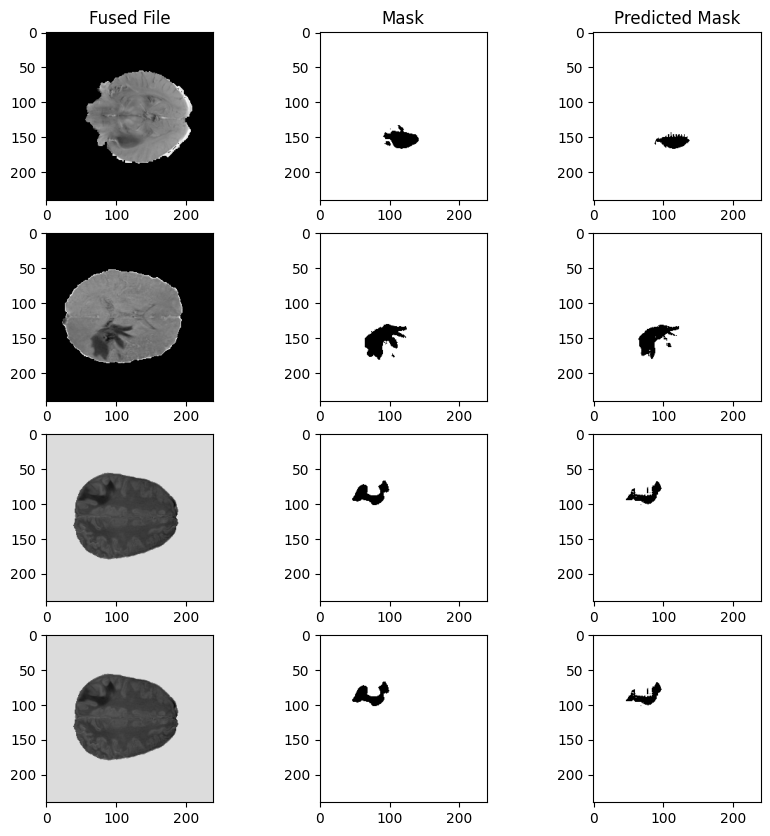

In [ ]:
#Visualise Segmentations
# The next batch iteration is selected
img_Batch, gt_Batch,_,batched_bbPoints,_ = next(iter(test_DataLoader))
#Each part of the batch, used, move to the GPU
img_Batch = img_Batch.to(device)
gt_Batch = gt_Batch.to(device)
batched_bbPoints = batched_bbPoints.to(device)
#Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
mri_List=[]
gt_List=[]
sam_Predict=[]
#https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
#Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
#The shapes of the tensors are adjusted and sent to the CPU for conversion
for i in range(4):
    image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
    gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
    image_Numpy = (image_Tensor * 255).astype(np.uint8)
    gt_Numpy = (gt_Tensor*255).astype(np.uint8)
    gt_List.append(gt_Numpy)
    mri_List.append(image_Numpy)
with torch.no_grad():
    # Generates the Image Embeddings
    FT_sam2_model.set_image_batch(mri_List)
    #Model predicts the segmentation masks and is prompted with bounding box
    prd_masks, scores, logits = FT_sam2_model.predict_batch(None,None,box_batch=batched_bbPoints,multimask_output=True)
    #Ensures the masks are in the correct shape for the dice loss calculation
    prd_masks = torch.from_numpy(np.stack(prd_masks))
    prd_masks = torch.sigmoid(prd_masks[:,0])
    #The predicted masks are converted back into NumPy arrays
    print(prd_masks.shape)
    for i in range(4):
        pm_Tensor = prd_masks[i].cpu().permute(0,1).numpy()
        sam_Predict.append(pm_Tensor)
#Displays the fused MRI scan, ground truth and predicted segmentation
fig, ax = plt.subplots(4,3, figsize=(10,10))
ax[0][0].imshow(mri_List[0], cmap="bone")
ax[0][0].set_title("Fused File")
ax[0][1].imshow(gt_List[0], cmap="binary")
ax[0][1].set_title("Mask")
ax[0][2].imshow(sam_Predict[0], cmap="binary")
ax[0][2].set_title("Predicted Mask")
ax[1][0].imshow(mri_List[1], cmap="bone")
ax[1][1].imshow(gt_List[1], cmap="binary")
ax[1][2].imshow(sam_Predict[1], cmap="binary")
ax[2][0].imshow(mri_List[2], cmap="bone")
ax[2][1].imshow(gt_List[2], cmap="binary")
ax[2][2].imshow(sam_Predict[2], cmap="binary")
ax[3][0].imshow(mri_List[2], cmap="bone")
ax[3][1].imshow(gt_List[2], cmap="binary")
ax[3][2].imshow(sam_Predict[2], cmap="binary")

# Segmentations Without Prompts

torch.Size([4, 240, 240])


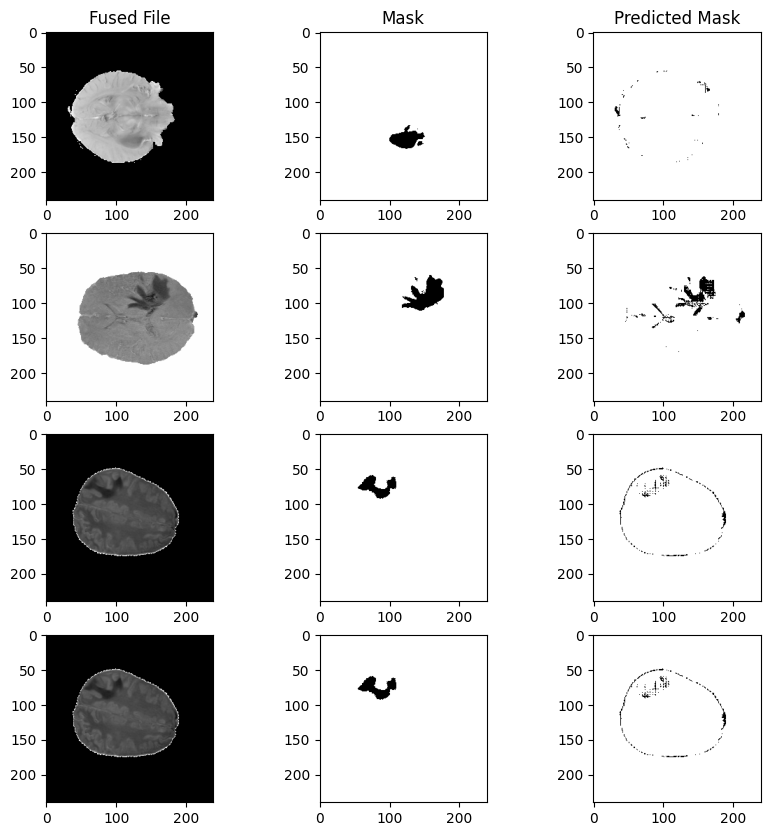

In [ ]:
#Visualise Segmentations
# The next batch iteration is selected
img_Batch, gt_Batch,_,batched_bbPoints,_ = next(iter(test_DataLoader))
#Each part of the batch, used, move to the GPU
img_Batch = img_Batch.to(device)
gt_Batch = gt_Batch.to(device)
batched_bbPoints = batched_bbPoints.to(device)
#Converting tensor image and ground truth batches back to NumPy arrays, for SAM 2, and adding them to a list
mri_List=[]
gt_List=[]
sam_Predict=[]
#https://stackoverflow.com/questions/64807876/how-can-i-convert-pytorch-tensor-to-ndarray-of-numpy
#Iterates through each MRI scan, Ground truth and prompt to convert them to NumPy arrays.
#The shapes of the tensors are adjusted and sent to the CPU for conversion
for i in range(4):
    image_Tensor = img_Batch[i].cpu().permute(0,1,2).numpy()
    gt_Tensor = gt_Batch[i].cpu().permute(0,1).numpy()
    image_Numpy = (image_Tensor * 255).astype(np.uint8)
    gt_Numpy = (gt_Tensor*255).astype(np.uint8)
    gt_List.append(gt_Numpy)
    mri_List.append(image_Numpy)
with torch.no_grad():
    # Generates the Image Embeddings
    FT_sam2_model.set_image_batch(mri_List)
    #Model predicts the segmentation masks and is prompted with bounding box
    prd_masks, scores, logits = FT_sam2_model.predict_batch(None,None,None,multimask_output=True)
    #Ensures the masks are in the correct shape for the dice loss calculation
    prd_masks = torch.from_numpy(np.stack(prd_masks))
    prd_masks = torch.sigmoid(prd_masks[:,0])
    #The predicted masks are converted back into NumPy arrays
    print(prd_masks.shape)
    for i in range(4):
        pm_Tensor = prd_masks[i].cpu().permute(0,1).numpy()
        sam_Predict.append(pm_Tensor)

#Displays the fused MRI scan, ground truth and predicted segmentation
fig, ax = plt.subplots(4,3, figsize=(10,10))
ax[0][0].imshow(mri_List[0], cmap="bone")
ax[0][0].set_title("Fused File")
ax[0][1].imshow(gt_List[0], cmap="binary")
ax[0][1].set_title("Mask")
ax[0][2].imshow(sam_Predict[0], cmap="binary")
ax[0][2].set_title("Predicted Mask")
ax[1][0].imshow(mri_List[1], cmap="bone")
ax[1][1].imshow(gt_List[1], cmap="binary")
ax[1][2].imshow(sam_Predict[1], cmap="binary")
ax[2][0].imshow(mri_List[2], cmap="bone")
ax[2][1].imshow(gt_List[2], cmap="binary")
ax[2][2].imshow(sam_Predict[2], cmap="binary")
ax[3][0].imshow(mri_List[2], cmap="bone")
ax[3][1].imshow(gt_List[2], cmap="binary")
ax[3][2].imshow(sam_Predict[2], cmap="binary")